In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import nltk
from nltk.stem import WordNetLemmatizer
from gensim.models import Word2Vec

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import re # for regex
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize,sent_tokenize
from nltk.stem import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB,MultinomialNB,BernoulliNB
from sklearn.metrics import accuracy_score
import pickle
import string
from sklearn.feature_extraction.text import TfidfVectorizer
import vaex

from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
# from google.colab import files

import nltk

from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import roc_curve,roc_auc_score

/home/pavankumar/anaconda3/lib/python3.8/site-packages/gensim/similarities/__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)


In [32]:
df=pd.read_csv('/home/pavankumar/data_sci_dec/internship_projects/Malignant Comments Classifier Project/train.csv')
df.head(3)
# df=vaex.from_csv('/home/pavankumar/data_sci_dec/internship_projects/Malignant Comments Classifier Project/train.csv',convert=True,chunk_size=5_000_000)
# df

,id,comment_text,malignant,highly_malignant,rude,threat,abuse,loathe
0,0000997932d777bf,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0
1,000103f0d9cfb60f,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0
2,000113f07ec002fd,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0


In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159571 entries, 0 to 159570
Data columns (total 8 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   id                159571 non-null  object
 1   comment_text      159571 non-null  object
 2   malignant         159571 non-null  int64 
 3   highly_malignant  159571 non-null  int64 
 4   rude              159571 non-null  int64 
 5   threat            159571 non-null  int64 
 6   abuse             159571 non-null  int64 
 7   loathe            159571 non-null  int64 
dtypes: int64(6), object(2)
memory usage: 9.7+ MB


In [27]:
type(df['malignant'])

pandas.core.series.Series

In [28]:
# df['malignant'].to_pandas_series()

### Creating single target column by malignant, highly_malignant, rude, threat, abuse, loathe columns"

In [34]:
lis=[]
for m,h,r,t,a,l in zip(df['malignant'],df['highly_malignant'],df['rude'],df['threat'],df['abuse'],df['loathe']):
    s=''
    if m==1:
        s+='malignant '
    if h==1:
        s+='highly_malignant '
    if r==1:
        s+='rude '
    if t==1:
        s+='threat '
    if a==1:
        s+='abuse '
    if l==1:
        s+='loathe '
  # else:
  #   s+='Nothing'
    lis.append(s)

In [35]:
df['target']=lis
df['target'].replace("","Normal",inplace=True)
df['target'].value_counts()

Normal                                                  143346
malignant                                                 5666
malignant rude abuse                                      3800
malignant rude                                            1758
malignant abuse                                           1215
malignant highly_malignant rude abuse                      989
malignant rude abuse loathe                                618
rude                                                       317
abuse                                                      301
malignant highly_malignant rude abuse loathe               265
rude abuse                                                 181
malignant highly_malignant rude                            158
malignant loathe                                           136
malignant abuse loathe                                     134
malignant rude threat abuse                                131
malignant threat                                       

In [36]:
# Cleaning Data functions

def removing_email_address(text):
    return text.replace(r'^.+@[^\.].*\.[a-z]{2,}$','')

def removing_emojis(text):
    return text.encode('ascii', 'ignore').decode('ascii')

def clean(text):
    cleaned = re.compile(r'<.*?>')
    return re.sub(cleaned,'',text) # substring replace with ''(space)

def is_special(text):
    rem = ''
    for i in text:
        if i.isalnum():
            rem = rem + i
        else:
            rem = rem + ' '
    return rem

def to_lower(text):
    return text.lower()

def removing_phone_number(text):
    return text.replace(r'^\(?[\d]{3}\)?[\s-]?[\d]{3}[\s-]?[\d]{4}$','')

def remove_numbers(text):
    return re.sub(r'\d','',text)

def remove_word_less_than_2(text):
    return [w for w in text.split() if len(w)>2]

def rem_stopwords(text):
    stop_words = set(stopwords.words('english') + ['u', 'ü', 'ur', '4', '2', 'im', 'doin', 'ure'])
    return [w for w in text if w not in stop_words]

def stem_txt(text):
    lemma_words=[]
    for word in text:
        word = WordNetLemmatizer().lemmatize(word,pos='v')
        lemma_words.append(word)
    return ' '.join(lemma_words)

# TFIDF Vectorizer
def tfidf_vect(Merged_review):
    tfid = TfidfVectorizer(smooth_idf=True)
    X = tfid.fit_transform(Merged_review).toarray()
    print("X.shape = ",X.shape)
    print("y.shape = ",y.shape)
    tfidf_bow=tfid.vocabulary_
    
    return X,tfidf_bow

# Count Vectorizer
def cv_vect(Merged_review):
    cv = CountVectorizer()
    X = cv.fit_transform(Merged_review).toarray()
    print("X.shape = ",X.shape)
    print("y.shape = ",y.shape)
    cv_bow=cv.vocabulary_
    
    return X,cv_bow


# For finding best random State
def best_rn_state(model,X,target):
    best_state=0
    accu=0
    for i in range(50,120):
        X_train, X_test, y_train, y_test = train_test_split(X,target, test_size=0.25,random_state=i)
        md = model
        md.fit(X_train,y_train)
        pred = md.predict(X_test)
        rscrore=accuracy_score(y_test,pred)
        if rscrore>accu:
            accu=rscrore
            best_state=i
    return best_state


# Testing Model manually
def test_data(text,bag_w,model,shape):
    rem_email=removing_email_address(text)
    rem_emoji=removing_emojis(rem_email)
    cln=clean(rem_emoji)
    isspecial=is_special(cln)
    tolower=to_lower(isspecial)
    removing_phonenumber=removing_phone_number(tolower)
    removenumbers=remove_numbers(removing_phonenumber)
    remove_word_lessthan2=remove_word_less_than_2(removenumbers)
    remstopwords=rem_stopwords(remove_word_lessthan2)
    stemtxt=stem_txt(remstopwords)
    bow,words = [],word_tokenize(stemtxt)
    for word in words:
        bow.append(words.count(word))

    inp = []
    for i in bag_w:
        inp.append(stemtxt.count(i[0]))
    y_pred = model.predict(np.array(inp).reshape(1,shape))
    return y_pred[0]

# Accuracy metrix
def accuracy_reports(testy,pred):
    print(classification_report(testy,pred))
    conf_mat=confusion_matrix(testy,pred)
    print("*****************************")
    print(conf_mat)
    plt.figure(figsize=(12,8))
    sns.heatmap(conf_mat,annot=True)
    plt.show()
    


### Cleaning the Comments text (removing numbers stopwords punctuations etc..)

In [37]:
lis=[]
for text in df['comment_text']:
    rem_email=removing_email_address(text)
    rem_emoji=removing_emojis(rem_email)
    cln=clean(rem_emoji)
    isspecial=is_special(cln)
    tolower=to_lower(isspecial)
    removing_phonenumber=removing_phone_number(tolower)
    removenumbers=remove_numbers(removing_phonenumber)
    remove_word_lessthan2=remove_word_less_than_2(removenumbers)
    remstopwords=rem_stopwords(remove_word_lessthan2)
    stemtxt=stem_txt(remstopwords)
    lis.append(stemtxt)
df['clean_comment_text']=lis

In [33]:
df['comment_length_after_clean']=df['clean_comment_text'].str.len()
df['comment_length_before_clean']=df['comment_text'].str.len()

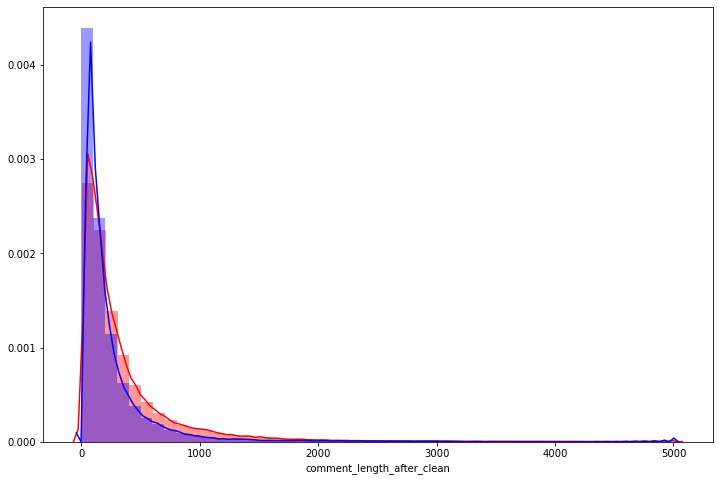

In [34]:
plt.figure(figsize=(12,8))
sns.distplot(df['comment_length_before_clean'],label='Comments before cleaning distribution',color='r',hist=True)
sns.distplot(df['comment_length_after_clean'],label='Comments after cleaning distribution',color='b',hist=True)
plt.show()

<AxesSubplot:>

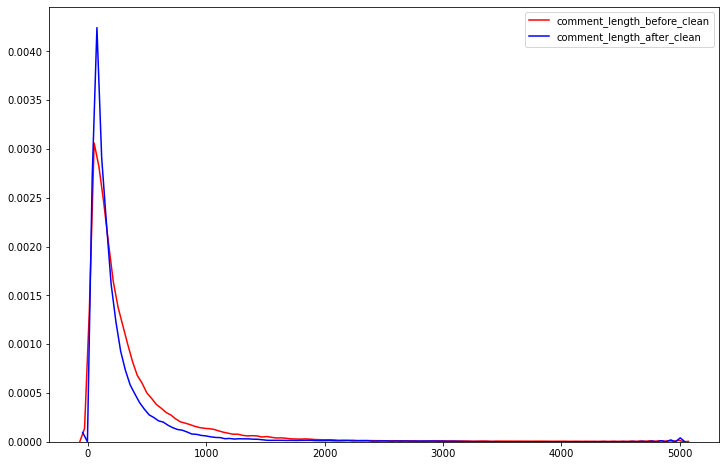

In [35]:
plt.figure(figsize=(12,8))
sns.kdeplot(df['comment_length_before_clean'],color='r')
sns.kdeplot(df['comment_length_after_clean'],color='b')


In [38]:
df['target'].value_counts().keys()

Index(['Normal', 'malignant ', 'malignant rude abuse ', 'malignant rude ',
       'malignant abuse ', 'malignant highly_malignant rude abuse ',
       'malignant rude abuse loathe ', 'rude ', 'abuse ',
       'malignant highly_malignant rude abuse loathe ', 'rude abuse ',
       'malignant highly_malignant rude ', 'malignant loathe ',
       'malignant abuse loathe ', 'malignant rude threat abuse ',
       'malignant threat ', 'malignant highly_malignant rude threat abuse ',
       'malignant rude threat abuse loathe ', 'loathe ',
       'malignant highly_malignant ', 'malignant rude loathe ',
       'malignant highly_malignant rude threat abuse loathe ', 'abuse loathe ',
       'threat ', 'rude abuse loathe ', 'malignant threat abuse ',
       'malignant highly_malignant abuse ',
       'malignant highly_malignant threat ', 'malignant rude threat ',
       'malignant highly_malignant abuse loathe ', 'malignant threat loathe ',
       'malignant highly_malignant rude loathe ',
       '

Normal **************************************************************************


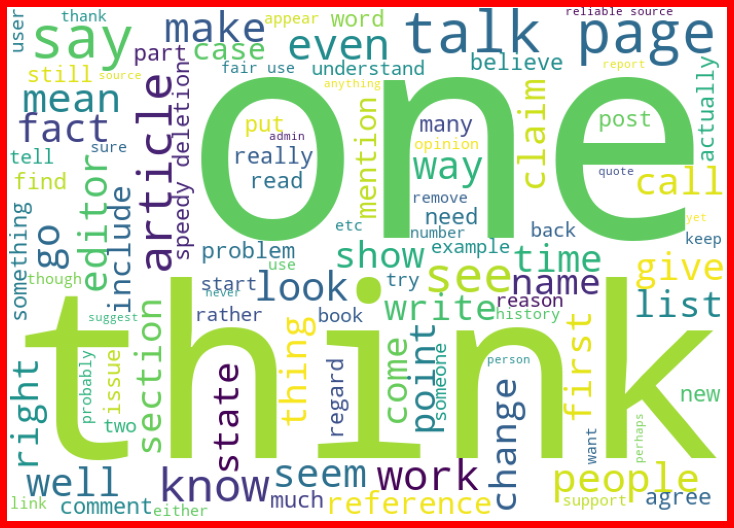

malignant  **************************************************************************


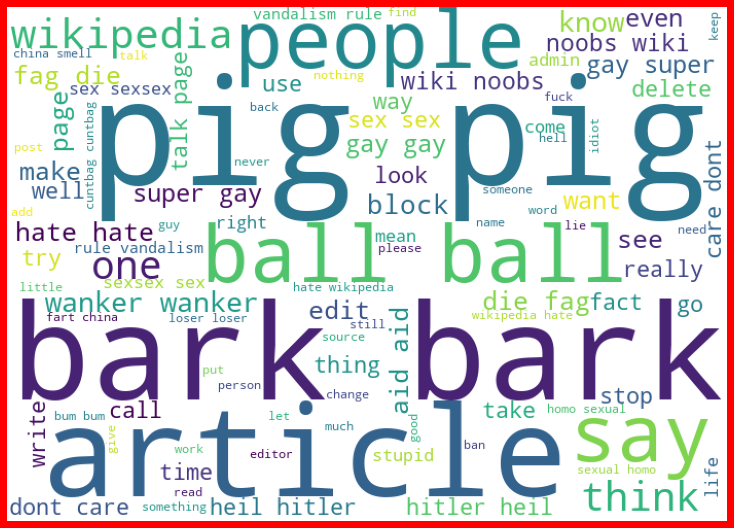

malignant rude abuse  **************************************************************************


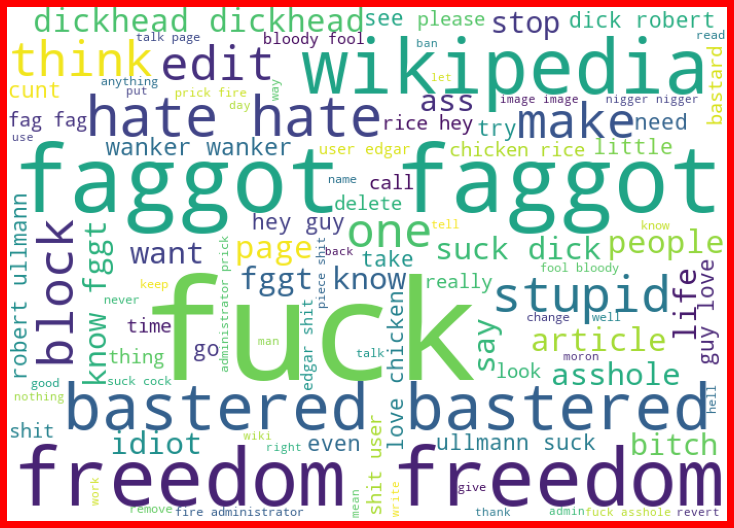

malignant rude  **************************************************************************


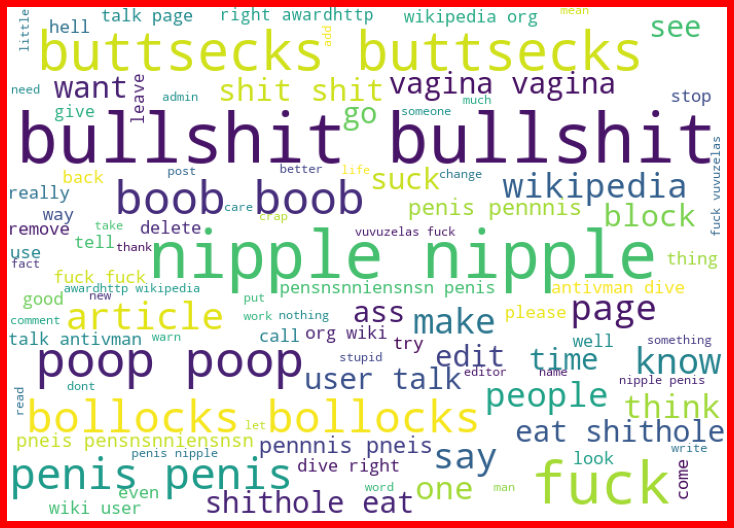

malignant abuse  **************************************************************************


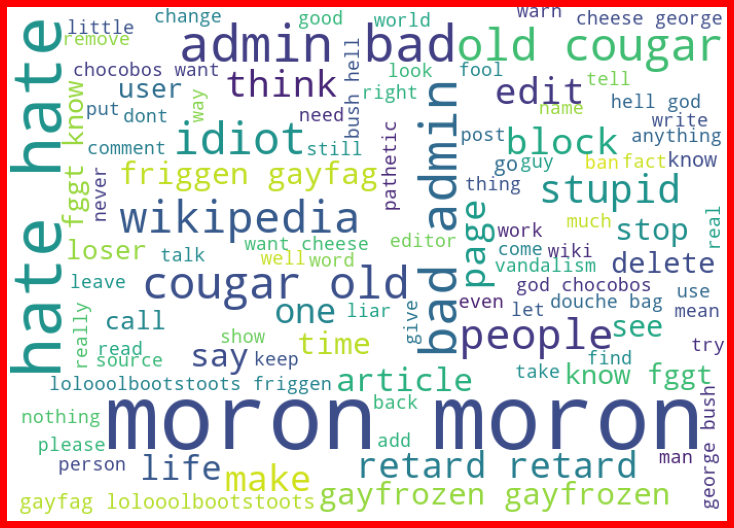

malignant highly_malignant rude abuse  **************************************************************************


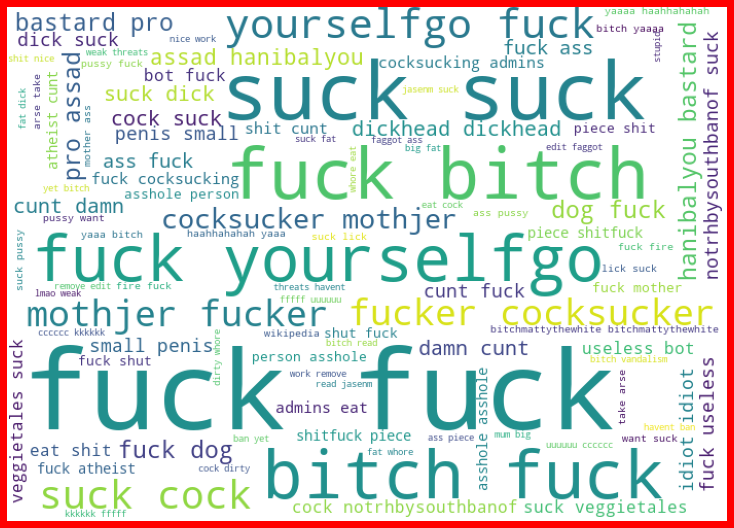

malignant rude abuse loathe  **************************************************************************


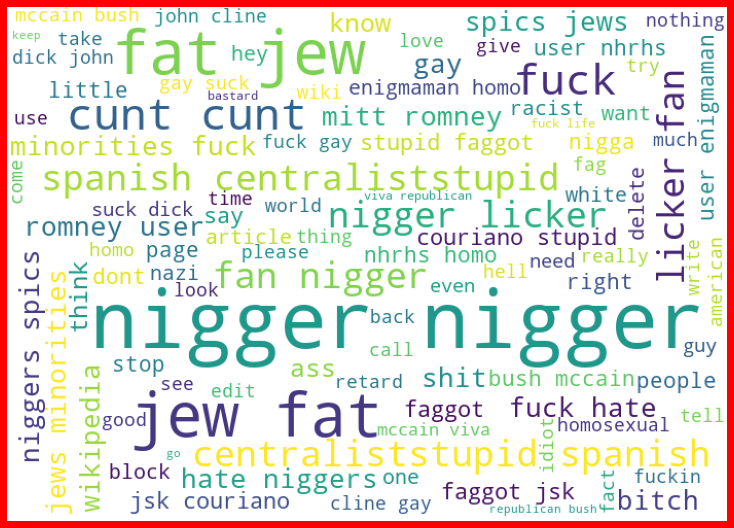

rude  **************************************************************************


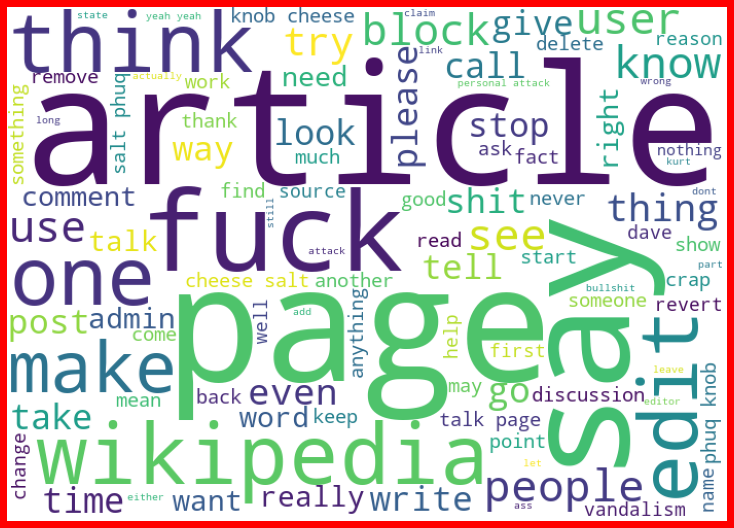

abuse  **************************************************************************


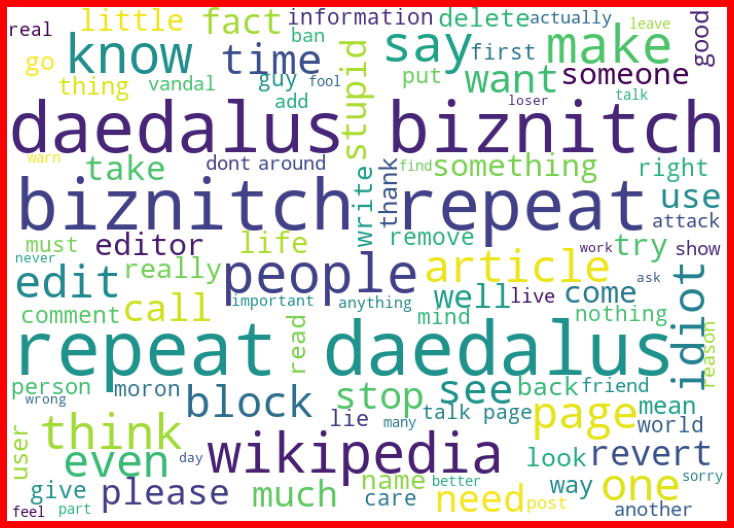

malignant highly_malignant rude abuse loathe  **************************************************************************


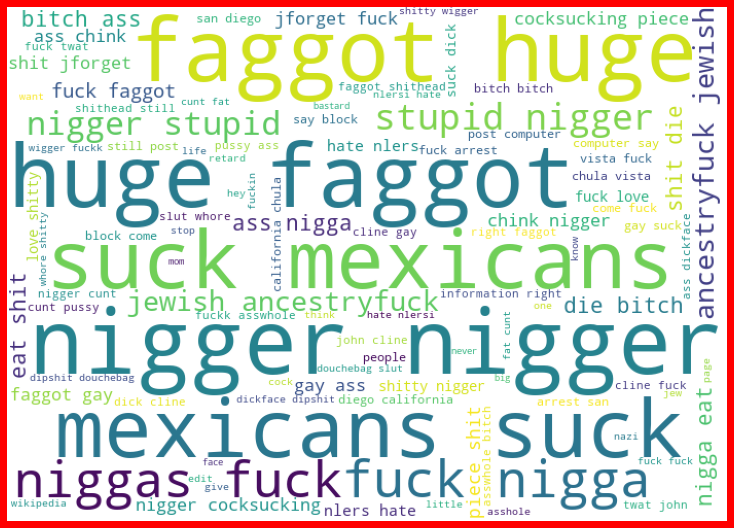

rude abuse  **************************************************************************


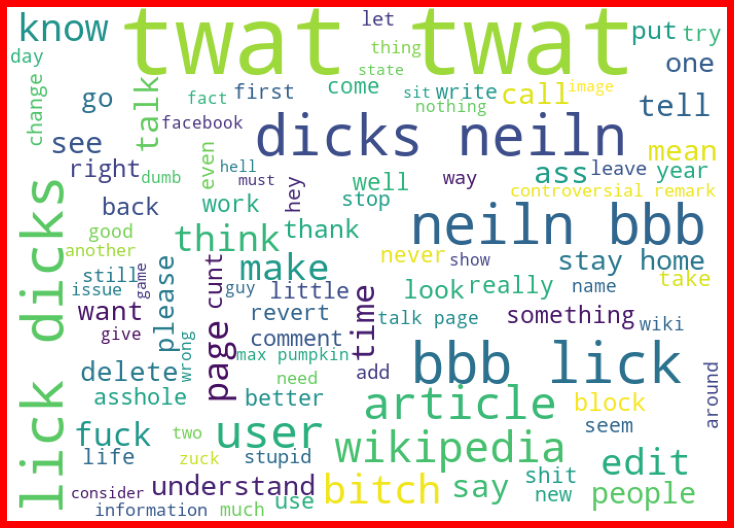

malignant highly_malignant rude  **************************************************************************


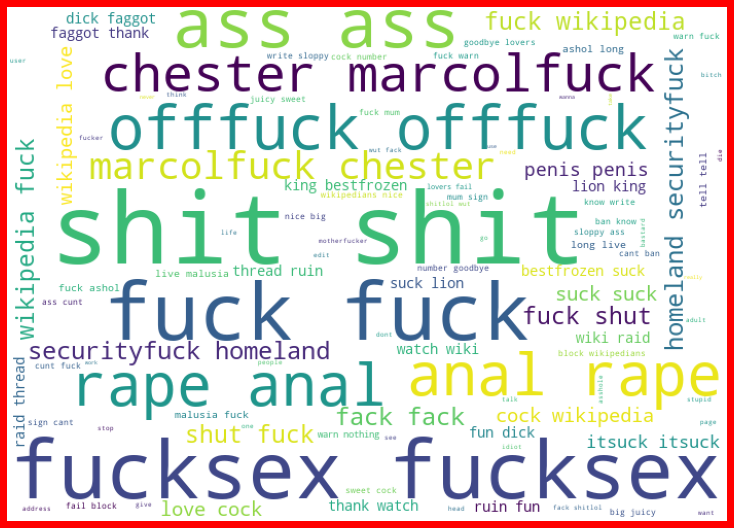

malignant loathe  **************************************************************************


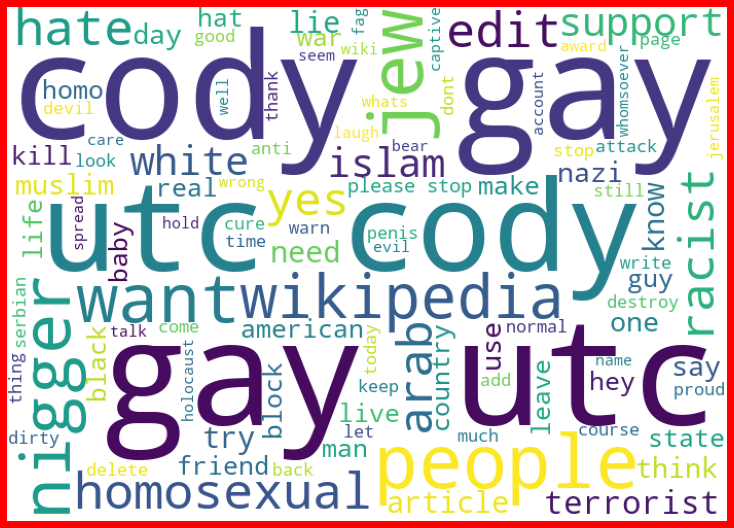

malignant abuse loathe  **************************************************************************


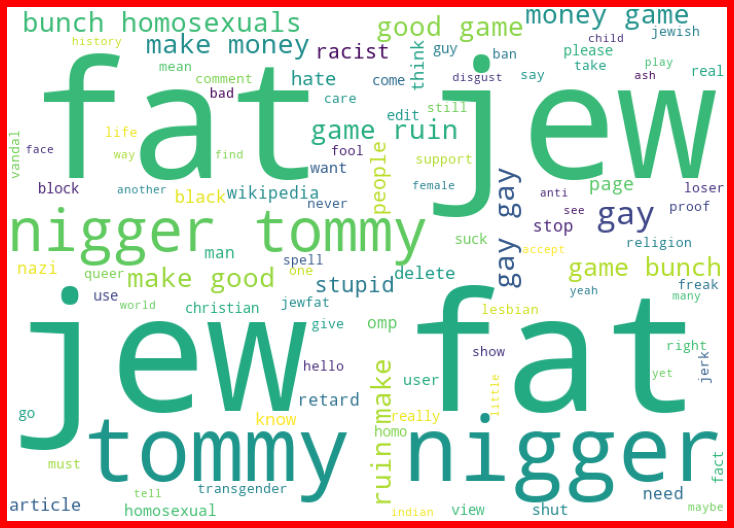

malignant rude threat abuse  **************************************************************************


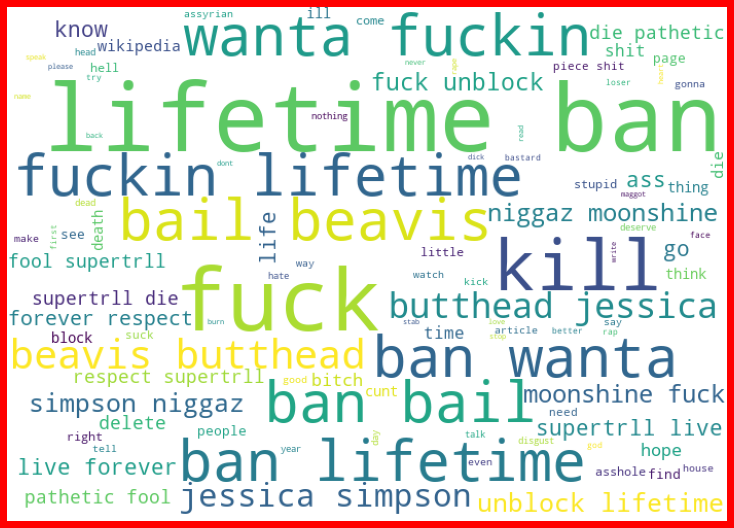

malignant threat  **************************************************************************


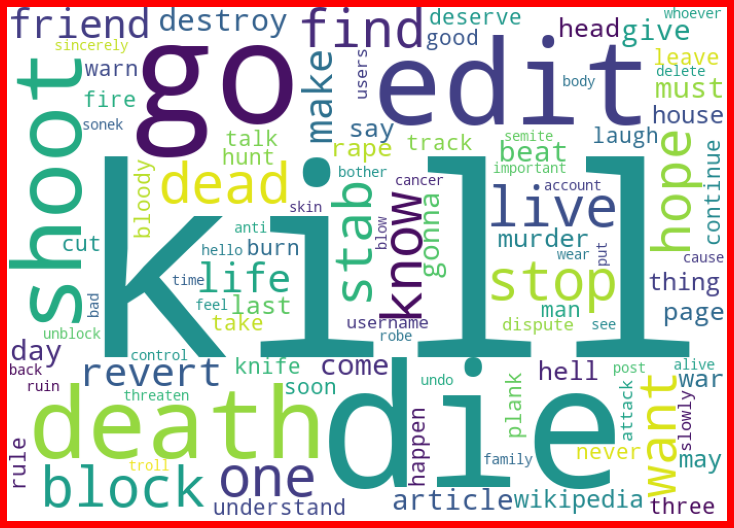

malignant highly_malignant rude threat abuse  **************************************************************************


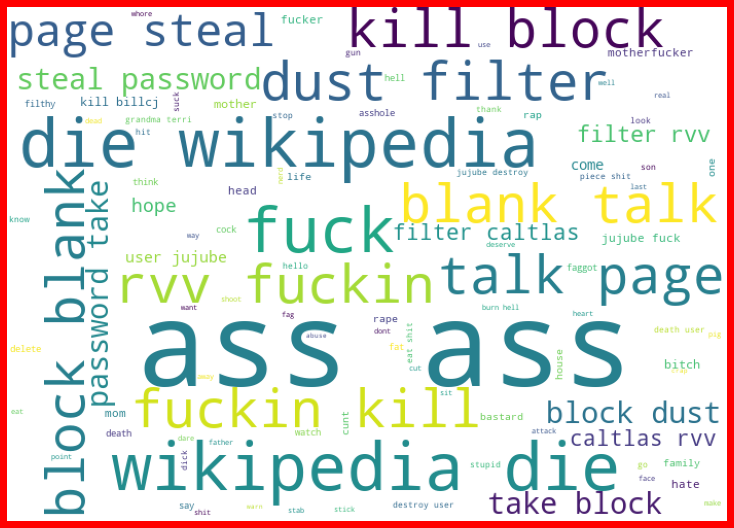

malignant rude threat abuse loathe  **************************************************************************


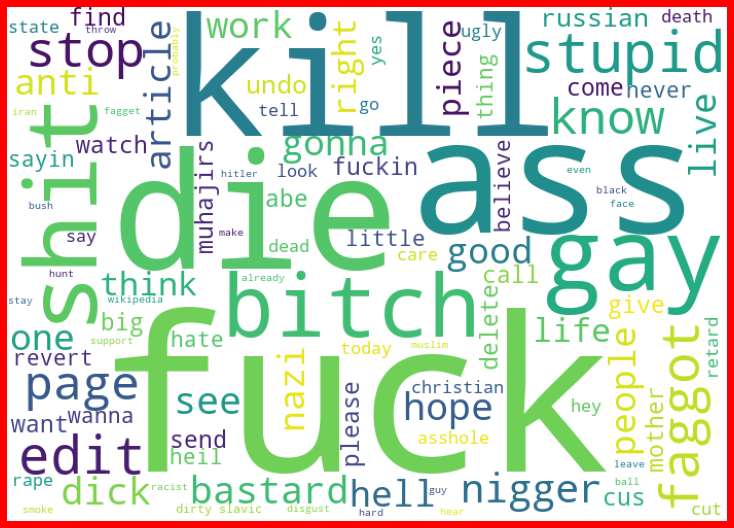

loathe  **************************************************************************


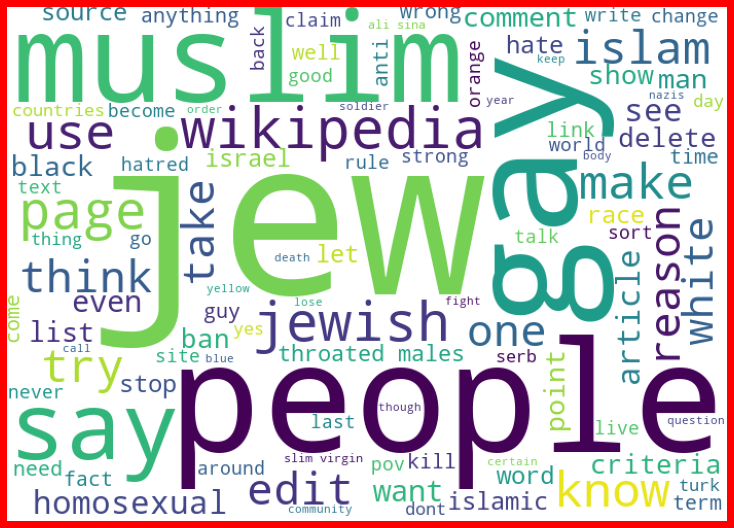

malignant highly_malignant  **************************************************************************


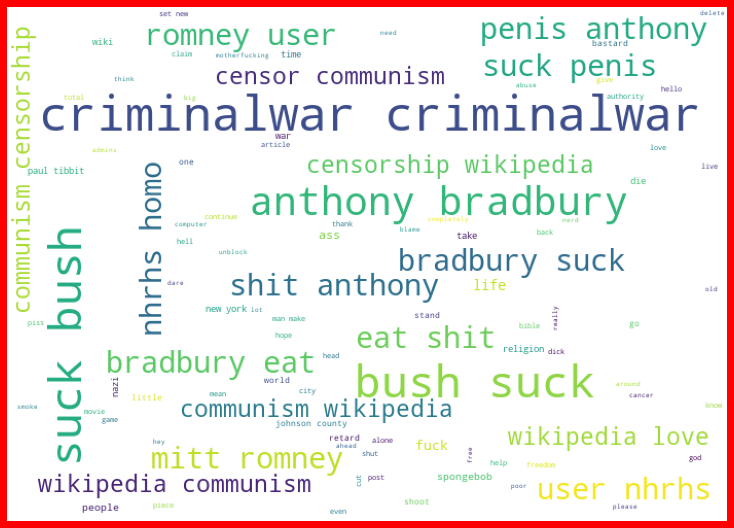

malignant rude loathe  **************************************************************************


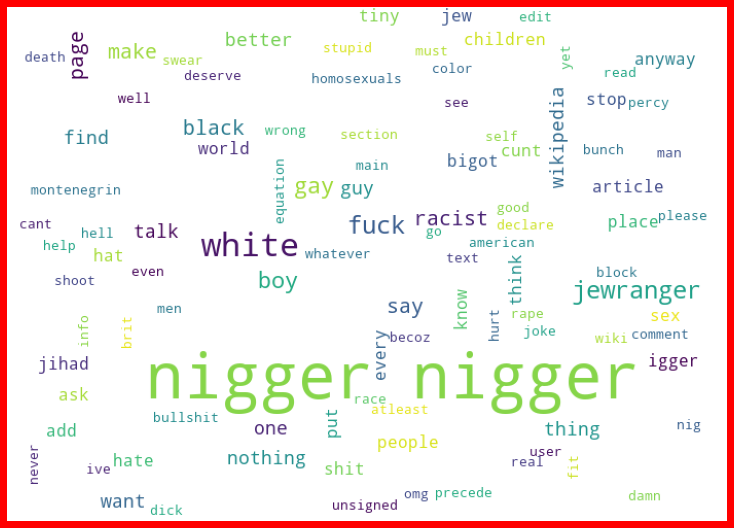

malignant highly_malignant rude threat abuse loathe  **************************************************************************


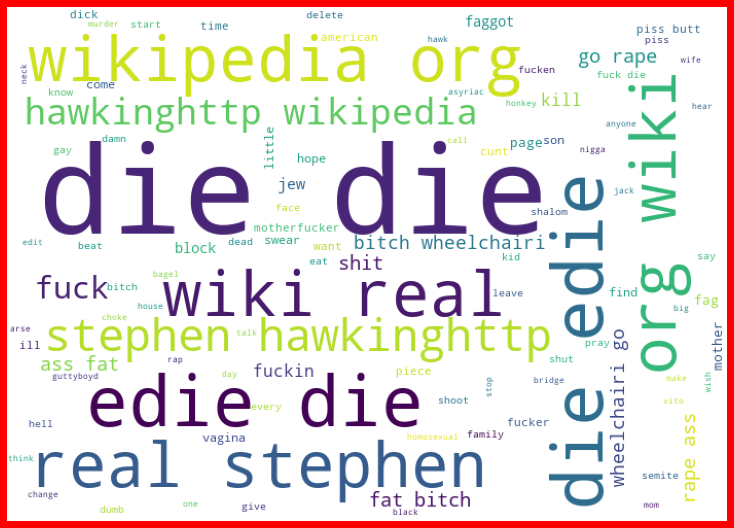

abuse loathe  **************************************************************************


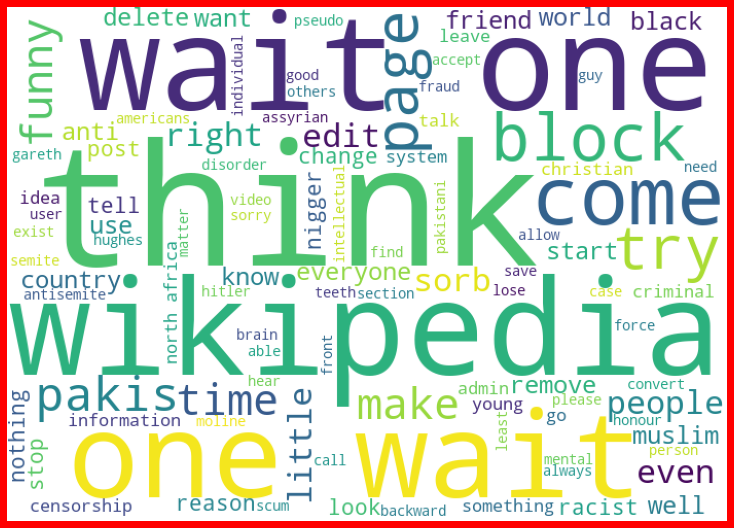

threat  **************************************************************************


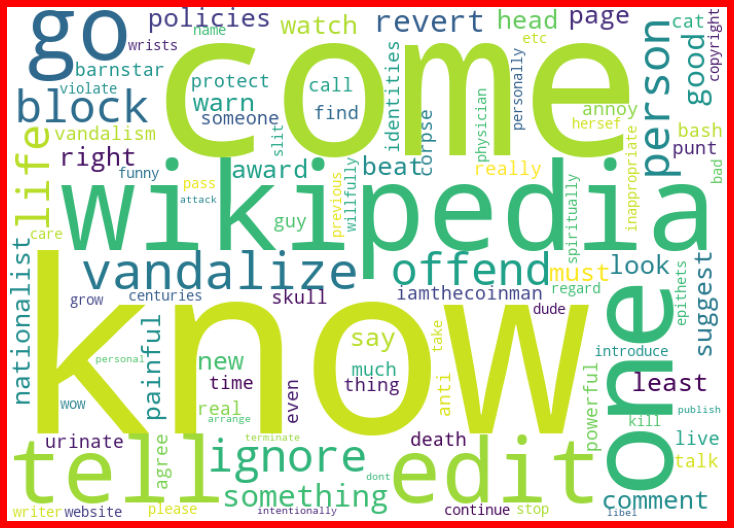

rude abuse loathe  **************************************************************************


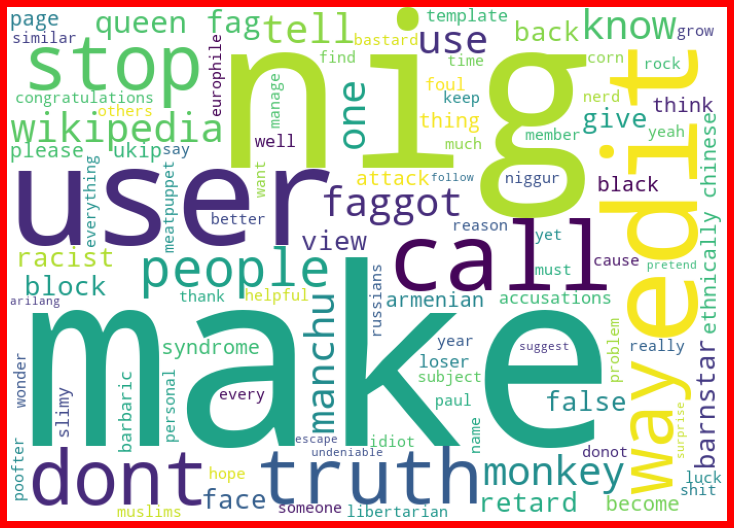

malignant threat abuse  **************************************************************************


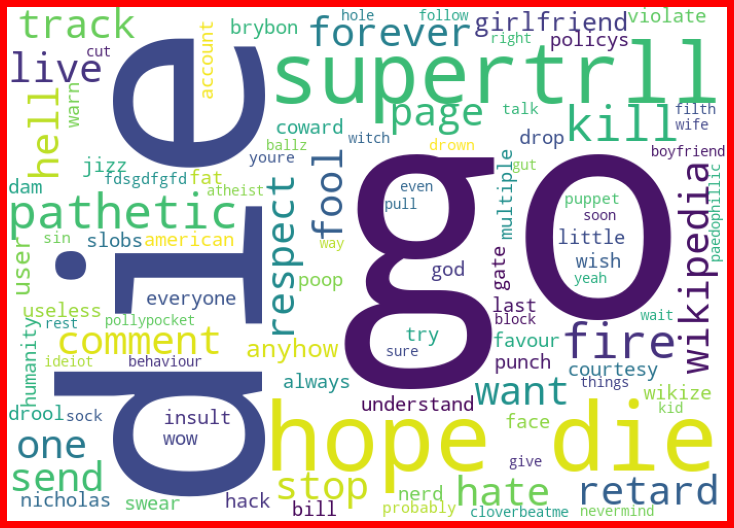

malignant highly_malignant abuse  **************************************************************************


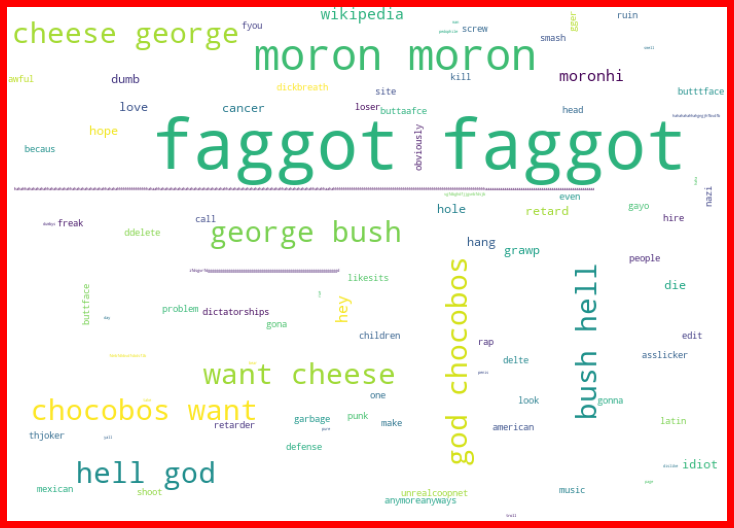

malignant highly_malignant threat  **************************************************************************


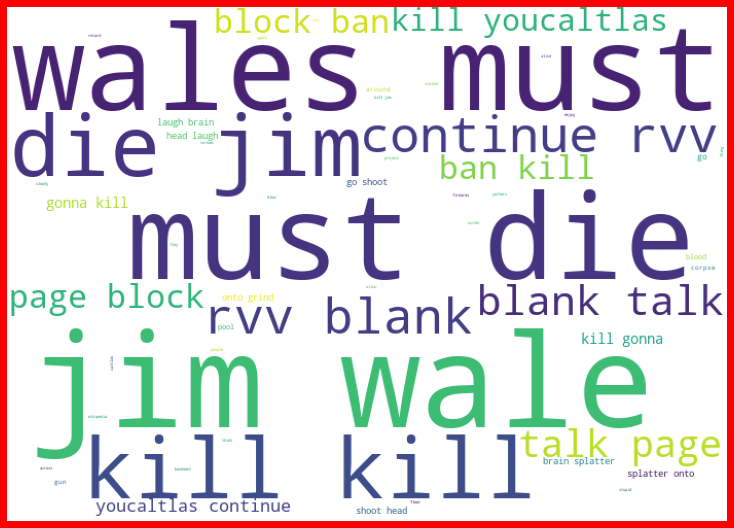

malignant rude threat  **************************************************************************


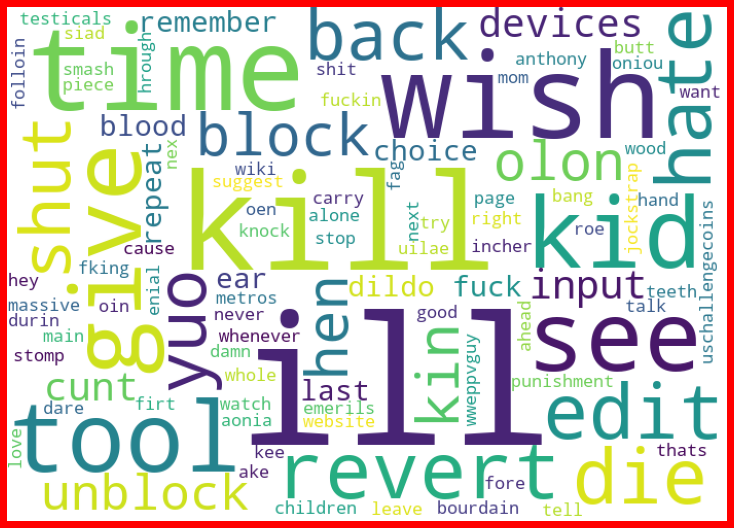

malignant highly_malignant abuse loathe  **************************************************************************


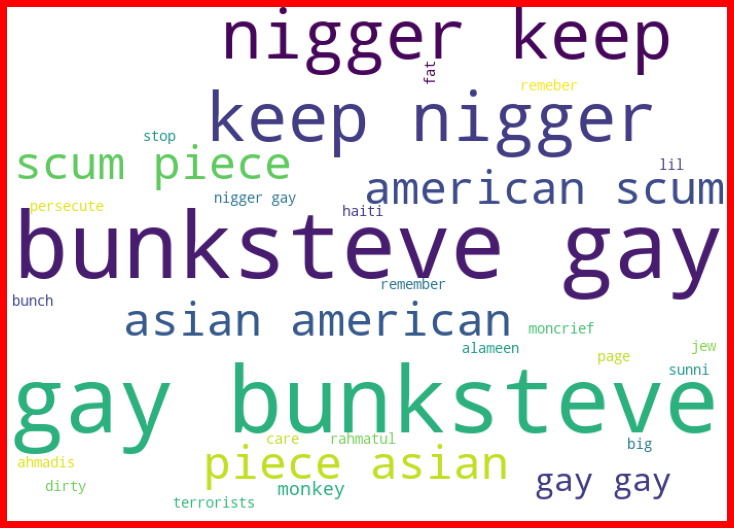

malignant threat loathe  **************************************************************************


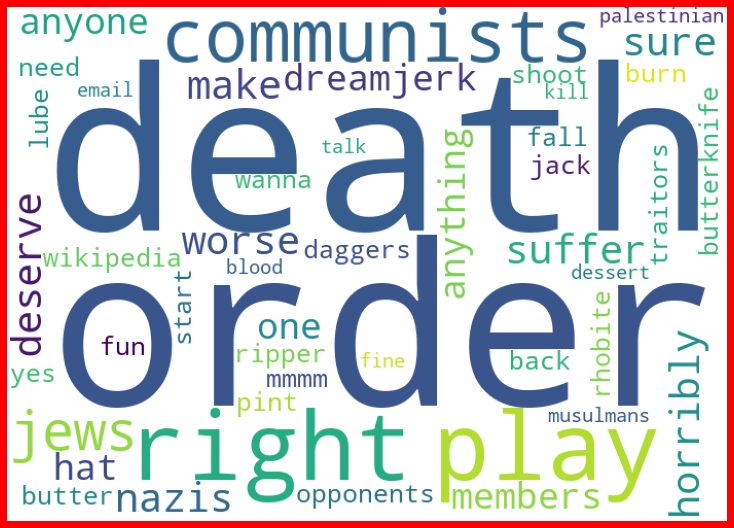

malignant highly_malignant rude loathe  **************************************************************************


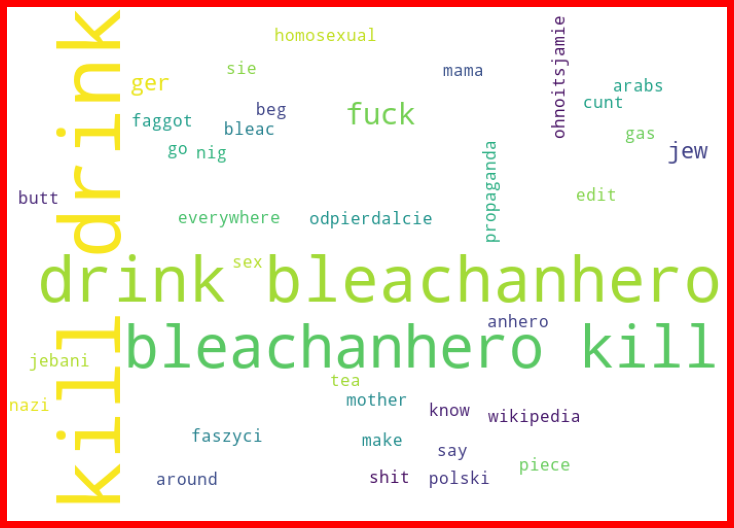

malignant highly_malignant rude threat  **************************************************************************


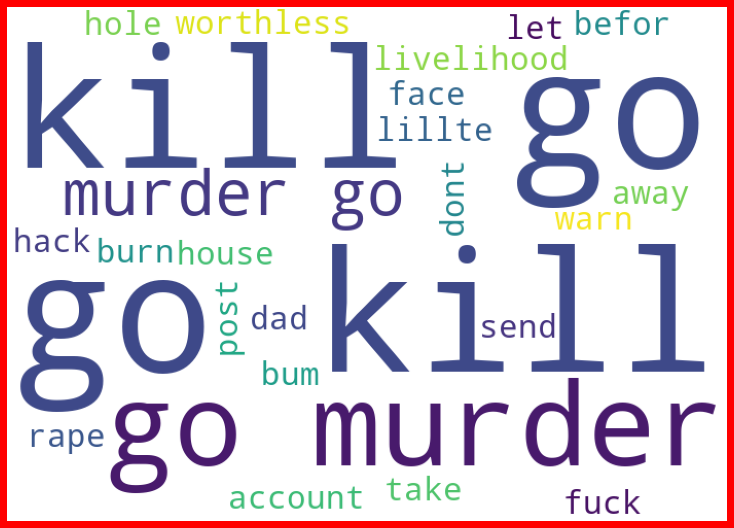

threat abuse  **************************************************************************


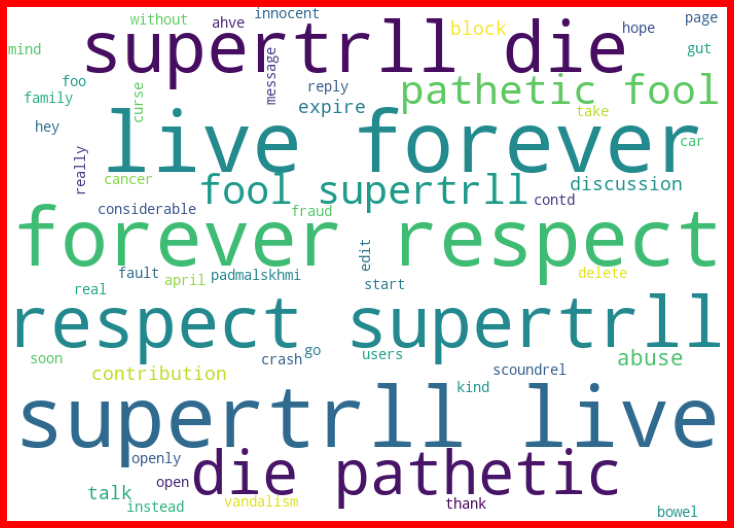

malignant threat abuse loathe  **************************************************************************


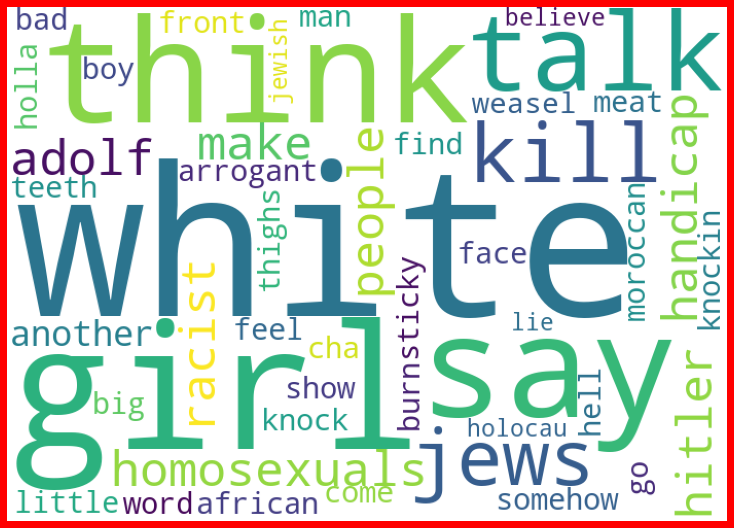

rude loathe  **************************************************************************


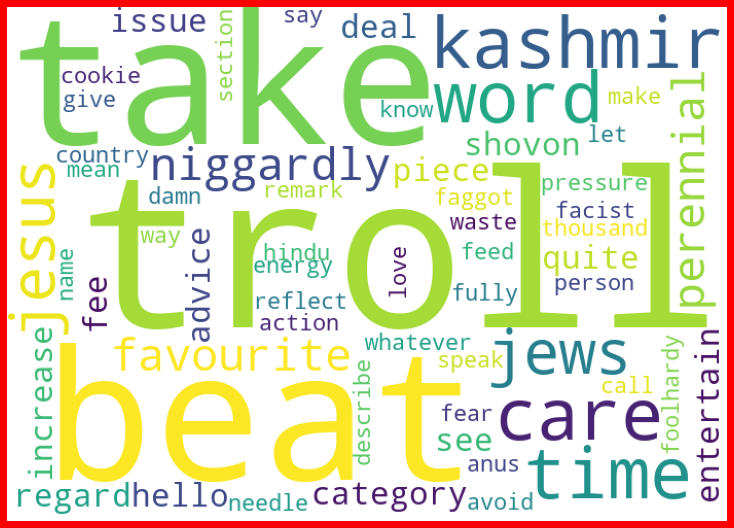

malignant highly_malignant loathe  **************************************************************************


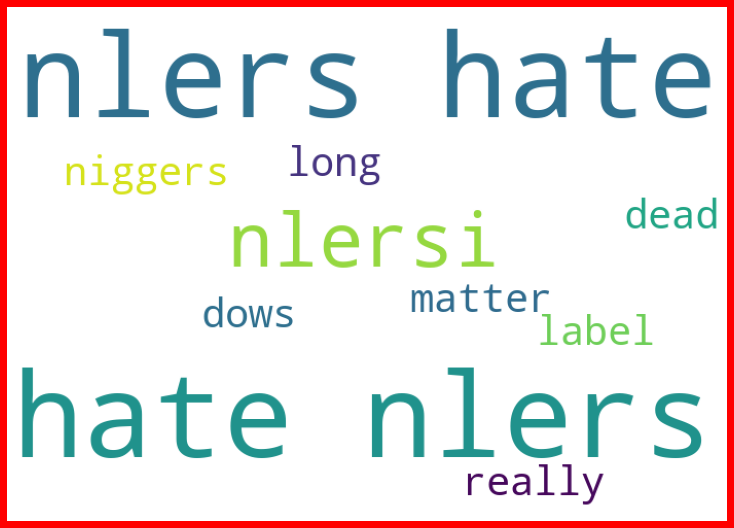

rude threat abuse  **************************************************************************


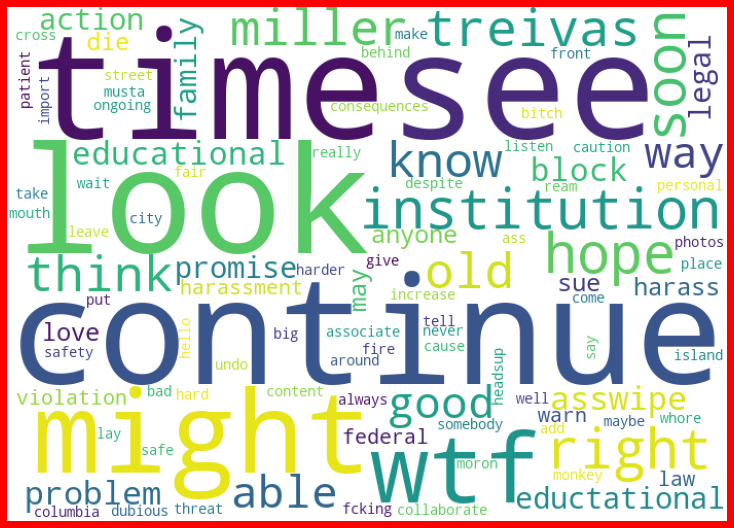

rude threat  **************************************************************************


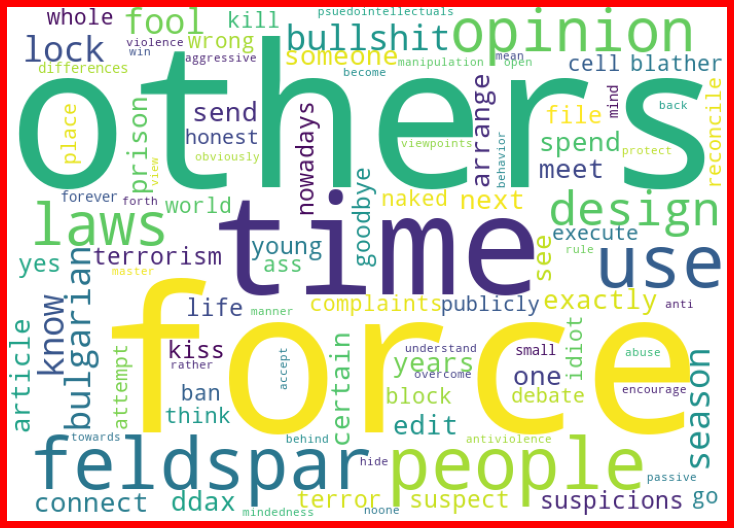

malignant highly_malignant threat loathe  **************************************************************************


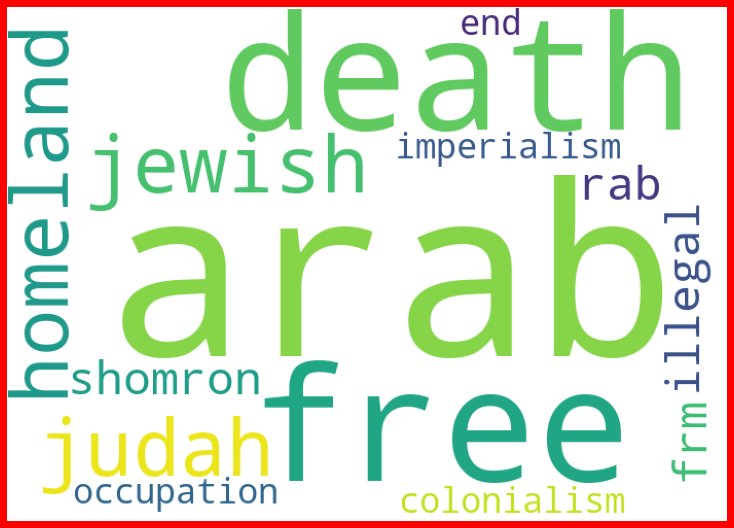

malignant highly_malignant threat abuse  **************************************************************************


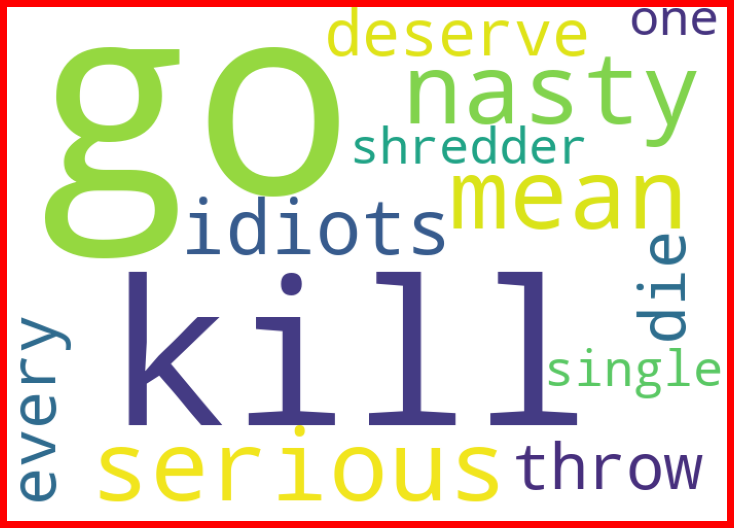

In [39]:
#Getting sense of loud words in spam 
from wordcloud import WordCloud

for val in df['target'].value_counts().keys():
    print(val,"**************************************************************************")
    spams = df['clean_comment_text'][df['target']==val]

    spam_cloud = WordCloud(width=700,height=500,background_color='white',max_words=100).generate(' '.join(spams))

    plt.figure(figsize=(10,8),facecolor='r')
    plt.imshow(spam_cloud)
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

In [146]:
df['clean_comment_text'][df['target']=='malignant ']

12        hey talk exclusive group talibans good destroy...
16                  bye look come think comming back tosser
44        sorry sorry screw around someones talk page ba...
59        believe fat artie see recent appearence tonigh...
151       sorry puck one ever say dick number one clearl...
                                ...                        
159394                                      bore retard two
159398    idiot revert reversion make moron decent commo...
159423    middle age losers home parent basements live b...
159448                                            yeah suck
159478    thank give misuse tool itchy trigger finger ex...
Name: clean_comment_text, Length: 5666, dtype: object

In [38]:
df['target'].value_counts()

Normal                                                  143346
malignant                                                 5666
malignant rude abuse                                      3800
malignant rude                                            1758
malignant abuse                                           1215
malignant highly_malignant rude abuse                      989
malignant rude abuse loathe                                618
rude                                                       317
abuse                                                      301
malignant highly_malignant rude abuse loathe               265
rude abuse                                                 181
malignant highly_malignant rude                            158
malignant loathe                                           136
malignant abuse loathe                                     134
malignant rude threat abuse                                131
malignant threat                                       

#### Creating dictionary of all target value with a numerical key value

In [39]:
di={}

for n,i in enumerate(df['target'].value_counts().index):
    di[i]=n

for key,val in di.items():
    df['target'].replace(key,val,inplace=True)

In [34]:
di

{'Normal': 0,
 'malignant ': 1,
 'malignant rude abuse ': 2,
 'malignant rude ': 3,
 'malignant abuse ': 4,
 'malignant highly_malignant rude abuse ': 5,
 'malignant rude abuse loathe ': 6,
 'rude ': 7,
 'abuse ': 8,
 'malignant highly_malignant rude abuse loathe ': 9,
 'rude abuse ': 10,
 'malignant highly_malignant rude ': 11,
 'malignant loathe ': 12,
 'malignant abuse loathe ': 13,
 'malignant rude threat abuse ': 14,
 'malignant threat ': 15,
 'malignant highly_malignant rude threat abuse ': 16,
 'malignant rude threat abuse loathe ': 17,
 'loathe ': 18,
 'malignant highly_malignant ': 19,
 'malignant rude loathe ': 20,
 'malignant highly_malignant rude threat abuse loathe ': 21,
 'abuse loathe ': 22,
 'threat ': 23,
 'rude abuse loathe ': 24,
 'malignant threat abuse ': 25,
 'malignant highly_malignant abuse ': 26,
 'malignant highly_malignant threat ': 27,
 'malignant rude threat ': 28,
 'malignant highly_malignant abuse loathe ': 29,
 'malignant threat loathe ': 30,
 'malignant

### Creating new csv file which have feature and target column

In [149]:
df[['clean_comment_text','target']].to_csv("comments.csv",index=False)

### Reading Vaex file

In [2]:
vaex_df=vaex.from_csv('/home/pavankumar/data_sci_dec/internship_projects/Malignant Comments Classifier Project/comments.csv',convert=True,chunk_size=5_000_000)
vaex_df

#,clean_comment_text,target
0,'explanation edit make username hardcore metalli...,0
1,'aww match background colour seemingly stick tha...,0
2,'hey man really try edit war guy constantly remo...,0
3,'make real suggestions improvement wonder sectio...,0
4,sir hero chance remember page,0
...,...,...
"159,566",'second time ask view completely contradict cove...,0
"159,567",ashamed horrible thing put talk page,0
"159,568",'spitzer umm theres actual article prostitution ...,0
"159,569",'look like actually put speedy first version del...,0


In [3]:
vaex_df.info()

### Removing Null values

In [9]:
vaex_df=vaex_df.dropna()

In [10]:

# seperating lable and target  column on sample data

X = np.array(vaex_df['clean_comment_text'].values)
y = np.array(vaex_df["target"].values)

### With CountVectirizer

In [11]:
cv = CountVectorizer()
X = cv.fit_transform(vaex_df['clean_comment_text'].to_pandas_series())
print("X.shape = ",X.shape)
print("y.shape = ",y.shape)
cv_bow=cv.vocabulary_

X.shape =  (159442, 158590)
y.shape =  (159442,)


### With TF-IDF

In [12]:
tfid = TfidfVectorizer(smooth_idf=True)
X_tfid = tfid.fit_transform(vaex_df['clean_comment_text'].to_pandas_series())
print("X.shape = ",X_tfid.shape)
print("y.shape = ",y.shape)
tfidf_bow=tfid.vocabulary_

X.shape =  (159442, 158590)
y.shape =  (159442,)


### With Count Vectorizer

In [160]:
# 2. Train test split
trainx,testx,trainy,testy = train_test_split(X,y,test_size=0.3,random_state=109)
print("Train shapes : X = {}, y = {}".format(trainx.shape,trainy.shape))
print("Test shapes : X = {}, y = {}".format(testx.shape,testy.shape))

cv_mnb = MultinomialNB(alpha=0.1,fit_prior=True)
cv_mnb.fit(trainx,trainy)
cv_p = cv_mnb.predict(testx)

print("Training Score = ",cv_mnb.score(trainx,trainy))
print("Multinomial = ",   accuracy_score(testy,tf_p))


Train shapes : X = (111609, 158590), y = (111609,)
Test shapes : X = (47833, 158590), y = (47833,)
Training Score =  0.9338404608947307
Multinomial =  0.8751071436037882


In [161]:
best_rn_state(cv_mnb,X,y)

103

In [163]:
# 2. Train test split
trainx,testx,trainy,testy = train_test_split(X,y,test_size=0.3,random_state=103)
print("Train shapes : X = {}, y = {}".format(trainx.shape,trainy.shape))
print("Test shapes : X = {}, y = {}".format(testx.shape,testy.shape))

cv_mnb = MultinomialNB(alpha=0.1,fit_prior=True)
cv_mnb.fit(trainx,trainy)
cv_p = cv_mnb.predict(testx)

print("Training Score = ",cv_mnb.score(trainx,trainy))
print("Multinomial = ",   accuracy_score(testy,tf_p))


Train shapes : X = (111609, 158590), y = (111609,)
Test shapes : X = (47833, 158590), y = (47833,)
Training Score =  0.9352381976363914
Multinomial =  0.874730834361215


### With TF-IDF

In [157]:
# 2. Train test split
trainx,testx,trainy,testy = train_test_split(X_tfid,y,test_size=0.3,random_state=109)
print("Train shapes : X = {}, y = {}".format(trainx.shape,trainy.shape))
print("Test shapes : X = {}, y = {}".format(testx.shape,testy.shape))

tf_mnb = MultinomialNB(alpha=0.1,fit_prior=True)
tf_mnb.fit(trainx,trainy)
tf_p = tf_mnb.predict(testx)

print("Training Score = ",tf_mnb.score(trainx,trainy))
print("Multinomial = ",   accuracy_score(testy,tf_p))


Train shapes : X = (111609, 158590), y = (111609,)
Test shapes : X = (47833, 158590), y = (47833,)
Training Score =  0.9190119076418568
Multinomial =  0.901908724102607


In [158]:
best_rn_state(tf_mnb,X_tfid,y)

59

In [14]:
# 2. Train test split
trainx,testx,trainy,testy = train_test_split(X_tfid,y,test_size=0.3,random_state=59)
print("Train shapes : X = {}, y = {}".format(trainx.shape,trainy.shape))
print("Test shapes : X = {}, y = {}".format(testx.shape,testy.shape))

tf_bnb =BernoulliNB()
tf_bnb.fit(trainx,trainy)
tf_bnbp = tf_mnb.predict(testx)

print("Training Score = ",tf_bnb.score(trainx,trainy))
print("Multinomial = ",   accuracy_score(testy,tf_bnbp))


Train shapes : X = (111609, 158590), y = (111609,)
Test shapes : X = (47833, 158590), y = (47833,)
Training Score =  0.8952503830336264
Multinomial =  0.8958250580143415


In [13]:
# 2. Train test split
trainx,testx,trainy,testy = train_test_split(X_tfid,y,test_size=0.3,random_state=59)
print("Train shapes : X = {}, y = {}".format(trainx.shape,trainy.shape))
print("Test shapes : X = {}, y = {}".format(testx.shape,testy.shape))

tf_mnb = MultinomialNB(alpha=0.1,fit_prior=True)
tf_mnb.fit(trainx,trainy)
tf_p = tf_mnb.predict(testx)

print("Training Score = ",tf_mnb.score(trainx,trainy))
print("Multinomial = ",   accuracy_score(testy,tf_p))


Train shapes : X = (111609, 158590), y = (111609,)
Test shapes : X = (47833, 158590), y = (47833,)
Training Score =  0.9177127292601851
Multinomial =  0.9050028223193193


### Saving Model in a picke format

In [14]:
pickle.dump(tf_mnb,open('comment_model_mulnb.pkl','wb'))
pickle.dump(tfidf_bow,open('comment_tfidf_mulnb_bow.pkl','wb'))

In [ ]:
rfc=RandomForestClassifier(n_estimators=300)
# 2. Train test split
trainx,testx,trainy,testy = train_test_split(X_tfid,y,test_size=0.3,random_state=109)
print("Train shapes : X = {}, y = {}".format(trainx.shape,trainy.shape))
print("Test shapes : X = {}, y = {}".format(testx.shape,testy.shape))

rfc.fit(trainx,trainy)
rfc_p = rfc.predict(testx)

print("Training Score = ",rfc.score(trainx,trainy))
print("Random Forest = ",   accuracy_score(testy,rfc_p))


Train shapes : X = (111609, 158590), y = (111609,)
Test shapes : X = (47833, 158590), y = (47833,)


### Testing Model manually

In [168]:
# Testing Model manually

rem_email=removing_email_address('')
rem_emoji=removing_emojis(rem_email)
cln=clean(rem_emoji)
isspecial=is_special(cln)
tolower=to_lower(isspecial)
removing_phonenumber=removing_phone_number(tolower)
removenumbers=remove_numbers(removing_phonenumber)
remove_word_lessthan2=remove_word_less_than_2(removenumbers)
remstopwords=rem_stopwords(remove_word_lessthan2)
stemtxt=stem_txt(remstopwords)
bow,words = [],word_tokenize(stemtxt)
for word in words:
    bow.append(words.count(word))

inp = []
for i in tfidf_bow:
    inp.append(stemtxt.count(i[0]))
y_pred = tf_mnb.predict(np.array(inp).reshape(1,158590))
for key,val in di.items():
    if di[key]==y_pred[0]:
        print(key)

Normal


In [ ]:
tf_prob = tf_mnb.predict_proba(testx)


###  Reading Test Data

In [3]:
test_df=pd.read_csv('/home/pavankumar/data_sci_dec/internship_projects/Malignant Comments Classifier Project/test.csv')
test_df.head(3)

,id,comment_text
0,00001cee341fdb12,Yo bitch Ja Rule is more succesful then you'll...
1,0000247867823ef7,== From RfC == \n\n The title is fine as it is...
2,00013b17ad220c46,""" \n\n == Sources == \n\n * Zawe Ashton on Lap..."


In [70]:
test_df.shape

(153164, 2)

In [71]:
lis=[]
for text in test_df['comment_text']:
    rem_email=removing_email_address(text)
    rem_emoji=removing_emojis(rem_email)
    cln=clean(rem_emoji)
    isspecial=is_special(cln)
    tolower=to_lower(isspecial)
    removing_phonenumber=removing_phone_number(tolower)
    removenumbers=remove_numbers(removing_phonenumber)
    remove_word_lessthan2=remove_word_less_than_2(removenumbers)
    remstopwords=rem_stopwords(remove_word_lessthan2)
    stemtxt=stem_txt(remstopwords)
    lis.append(stemtxt)
test_df['clean_comment_text']=lis

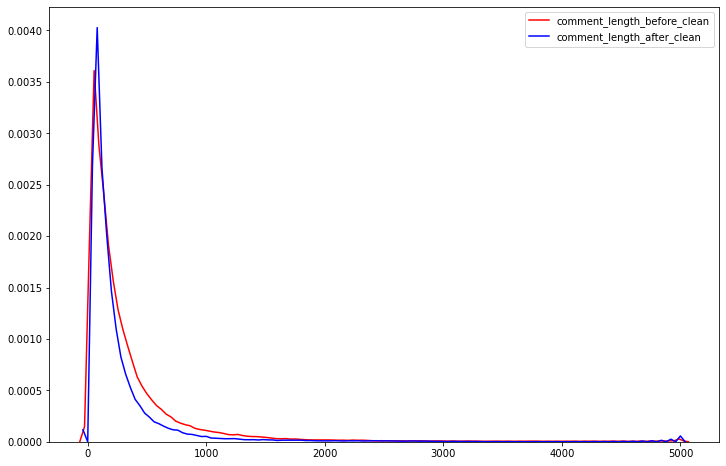

In [72]:
test_df['comment_length_after_clean']=test_df['clean_comment_text'].str.len()
test_df['comment_length_before_clean']=test_df['comment_text'].str.len()
plt.figure(figsize=(12,8))
sns.kdeplot(test_df['comment_length_before_clean'],color='r')
sns.kdeplot(test_df['comment_length_after_clean'],color='b')
plt.show()

In [44]:
test_df[['clean_comment_text']].to_csv("test_comments.csv",index=False)

In [23]:
vaex_test_df=vaex.from_csv('/home/pavankumar/data_sci_dec/internship_projects/test_comments.csv',convert=True,chunk_size=5_000_000)
vaex_test_df

#,clean_comment_text
0,'bitch rule succesful ever whats hat sad mofucka...
1,rfc title fine imo
2,source zawe ashton lapland
3,'look back source information update correct for...
4,anonymously edit article
...,...
"153,159",totally agree stuff nothing long crap
"153,160",'throw field home plate get faster throw cut man...
"153,161",'okinotorishima categories see change agree corr...
"153,162",'one found nations germany law return quite simi...


In [24]:
vaex_test_df=vaex_test_df.dropna()

In [25]:
pd.DataFrame(vaex_test_df['clean_comment_text'].to_pandas_series())

,0
0,bitch rule succesful ever whats hat sad mofuck...
1,rfc title fine imo
2,source zawe ashton lapland
3,look back source information update correct fo...
4,anonymously edit article
...,...
152064,totally agree stuff nothing long crap
152065,throw field home plate get faster throw cut ma...
152066,okinotorishima categories see change agree cor...
152067,one found nations germany law return quite sim...


In [75]:
tfid_test = TfidfVectorizer(smooth_idf=True)
text_X=tfid_test.fit_transform(vaex_test_df['clean_comment_text'].to_pandas_series())
print("X.shape = ",text_X.shape)

X.shape =  (152069, 187037)


In [9]:
test_model=pickle.load(open('/home/pavankumar/data_sci_dec/internship_projects/comment_model_mulnb.pkl','rb'))
test_model

MultinomialNB(alpha=0.1)

In [10]:
test_bow=pickle.load(open('/home/pavankumar/data_sci_dec/internship_projects/comment_tfidf_mulnb_bow.pkl','rb'))
test_bow

{'explanation': 46791,
 'edit': 41763,
 'make': 83744,
 'username': 147310,
 'hardcore': 59606,
 'metallica': 87905,
 'fan': 47834,
 'revert': 117770,
 'vandalisms': 148072,
 'closure': 26261,
 'gas': 53588,
 'vote': 150440,
 'new': 95314,
 'york': 157098,
 'dolls': 39126,
 'fac': 47264,
 'please': 107168,
 'remove': 116524,
 'template': 137795,
 'talk': 136421,
 'page': 102220,
 'since': 127283,
 'retire': 117574,
 'aww': 11130,
 'match': 85577,
 'background': 11568,
 'colour': 27198,
 'seemingly': 123902,
 'stick': 132277,
 'thank': 138557,
 'january': 70760,
 'utc': 147485,
 'hey': 61536,
 'man': 84171,
 'really': 114651,
 'try': 143093,
 'war': 151186,
 'guy': 58358,
 'constantly': 28975,
 'relevant': 116274,
 'information': 67397,
 'instead': 68086,
 'seem': 123898,
 'care': 21671,
 'format': 50990,
 'actual': 1398,
 'info': 67334,
 'real': 114592,
 'suggestions': 133915,
 'improvement': 66228,
 'wonder': 154750,
 'section': 123774,
 'statistics': 131861,
 'later': 78527,
 'subsec

In [78]:
vaex_test_df['clean_comment_text'].to_pandas_series()

0         bitch rule succesful ever whats hat sad mofuck...
1                                        rfc title fine imo
2                                source zawe ashton lapland
3         look back source information update correct fo...
4                                  anonymously edit article
                                ...                        
152064                totally agree stuff nothing long crap
152065    throw field home plate get faster throw cut ma...
152066    okinotorishima categories see change agree cor...
152067    one found nations germany law return quite sim...
152068    stop already bullshit welcome fool think kind ...
Length: 152069, dtype: object

In [11]:
# Testing Model manually
predicted_val=[]
for text in vaex_test_df['clean_comment_text'].to_pandas_series():
    stemtxt=stem_txt(text)
    inp = []
    for i in test_bow:
        inp.append(stemtxt.count(i[0]))
    predicted_val.append(test_model.predict(np.array(inp).reshape(1,158590)))
predicted_val

[array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([35]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([35]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array([39]),
 array

In [20]:
pd.DataFrame(predicted_val).value_counts()

39    145418
35      4719
37      1186
38       309
36       181
32       151
30        29
33        23
29        18
34        17
31        11
19         2
24         2
27         2
28         1
dtype: int64

In [35]:
di

{'Normal': 0,
 'malignant ': 1,
 'malignant rude abuse ': 2,
 'malignant rude ': 3,
 'malignant abuse ': 4,
 'malignant highly_malignant rude abuse ': 5,
 'malignant rude abuse loathe ': 6,
 'rude ': 7,
 'abuse ': 8,
 'malignant highly_malignant rude abuse loathe ': 9,
 'rude abuse ': 10,
 'malignant highly_malignant rude ': 11,
 'malignant loathe ': 12,
 'malignant abuse loathe ': 13,
 'malignant rude threat abuse ': 14,
 'malignant threat ': 15,
 'malignant highly_malignant rude threat abuse ': 16,
 'malignant rude threat abuse loathe ': 17,
 'loathe ': 18,
 'malignant highly_malignant ': 19,
 'malignant rude loathe ': 20,
 'malignant highly_malignant rude threat abuse loathe ': 21,
 'abuse loathe ': 22,
 'threat ': 23,
 'rude abuse loathe ': 24,
 'malignant threat abuse ': 25,
 'malignant highly_malignant abuse ': 26,
 'malignant highly_malignant threat ': 27,
 'malignant rude threat ': 28,
 'malignant highly_malignant abuse loathe ': 29,
 'malignant threat loathe ': 30,
 'malignant

In [40]:
predicted_val_name=[]
for pred in predicted_val:
    for key,val in di.items():
        if di[key]==pred[0]:
            predicted_val_name.append(key)
predicted_val_name

['malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'rude loathe ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat abuse ',
 'malignant highly_malignant threat ab

In [44]:
pd.DataFrame({"Comments":vaex_test_df['clean_comment_text'].to_pandas_series(),"Predidcted values":predicted_val_name}).to_csv("result.csv")

In [9]:
output=pd.read_csv('/home/pavankumar/data_sci_dec/internship_projects/result.csv')
output.drop('Unnamed: 0',axis=1)

,Comments,Predidcted values
0,bitch rule succesful ever whats hat sad mofuck...,malignant highly_malignant threat abuse
1,rfc title fine imo,malignant highly_malignant threat abuse
2,source zawe ashton lapland,malignant highly_malignant threat abuse
3,look back source information update correct fo...,malignant highly_malignant threat abuse
4,anonymously edit article,malignant highly_malignant threat abuse
...,...,...
152064,totally agree stuff nothing long crap,malignant highly_malignant threat abuse
152065,throw field home plate get faster throw cut ma...,malignant highly_malignant threat abuse
152066,okinotorishima categories see change agree cor...,malignant highly_malignant threat abuse
152067,one found nations germany law return quite sim...,malignant highly_malignant threat abuse


In [10]:
output['Predidcted values'].value_counts()

malignant highly_malignant threat abuse     145418
rude loathe                                   4719
rude threat                                   1186
rude threat abuse                              309
malignant threat abuse loathe                  181
malignant highly_malignant rude threat         151
malignant threat loathe                         29
malignant highly_malignant loathe               23
malignant highly_malignant abuse loathe         18
threat abuse                                    17
malignant highly_malignant rude loathe          11
malignant highly_malignant threat                2
malignant highly_malignant                       2
rude abuse loathe                                2
malignant rude threat                            1
Name: Predidcted values, dtype: int64

### With sentiment Intensity Analyzer

In [57]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer


# Test how SentimentIntensityAnalyzer works
sia = SentimentIntensityAnalyzer()

print (sia.polarity_scores(vaex_df[vaex_df['target']==7][2][0]))

{'neg': 0.299, 'neu': 0.487, 'pos': 0.214, 'compound': -0.9201}


In [7]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
# 2. Train test split
trainx,testx,trainy,testy = train_test_split(X_tfid,y,test_size=0.3,random_state=109)
print("Train shapes : X = {}, y = {}".format(trainx.shape,trainy.shape))
print("Test shapes : X = {}, y = {}".format(testx.shape,testy.shape))

tf_mnb = KNeighborsClassifier()
tf_mnb.fit(trainx,trainy)
tf_p = tf_mnb.predict(testx)

print("Training Score = ",tf_mnb.score(trainx,trainy))
print("Multinomial = ",   accuracy_score(testy,tf_p))


Train shapes : X = (111609, 158590), y = (111609,)
Test shapes : X = (47833, 158590), y = (47833,)
